# Overlapping spikes

# DW 2015.12.1

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from scipy.signal import medfilt, triang
import gitInformation

In [2]:
% matplotlib inline

In [3]:
gitInformation.printInformation()

Information about this notebook
Date: 2015-12-14
Python Version: 2.7.10 |Anaconda 2.3.0 (64-bit)| (default, May 28 2015, 16:44:52) [MSC v.1500 64 bit (AMD64)]
Git directory: C:\Users\Dominik\Documents\GitRep\kt-2015-DSPHandsOn\.git
Current git SHA: 1744915ffcb1264b4b5bd0dfa2df815dce1ed8c3
Remotes: fork, origin, 
Current branch: master
fork remote URL: http://github.com/dowa4213/kt-2015-DSPHandsOn.git
origin remote URL: https://github.com/ktakagaki/kt-2015-DSPHandsOn.git


## Generating overlapping spikes

In [4]:
tri1 = np.array([0, 1, 2, 3, 4, 5, 4, 3, 2, 1, 2, 3, 4, 5, 4, 3, 2, 1, 0])
tri1 = tri1/5.
tri2 = np.array([0, 1, 2, 3, 4, 5, 4, 3, 2, 3, 4, 5, 4, 3, 2, 1, 0])
tri2 = tri2/5.
tri3 = np.array([0, 1, 2, 3, 4, 5, 4, 3,  4, 5, 4, 3, 2, 1, 0])
tri3 = tri3/5.
tri4 = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 7, 6, 5, 4, 3,  4, 5, 6, 7, 8, 7, 6, 5, 4, 3, 2, 1, 0])
tri4 = tri4/8.

In [5]:
x = np.zeros(30)
data = np.append(x, tri1)
data = np.append(data, x )
data = np.append(data,tri2)
data = np.append(data, x)
data = np.append(data, tri3)
data = np.append(data,x)

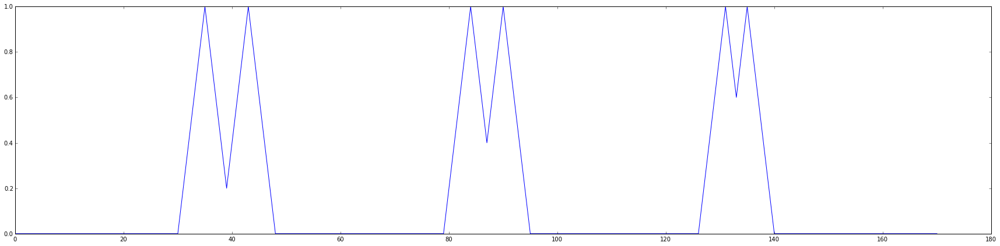

In [6]:
plt.figure(figsize=(30,7))
plt.plot(data)

## Adding noise and filter noised spikes

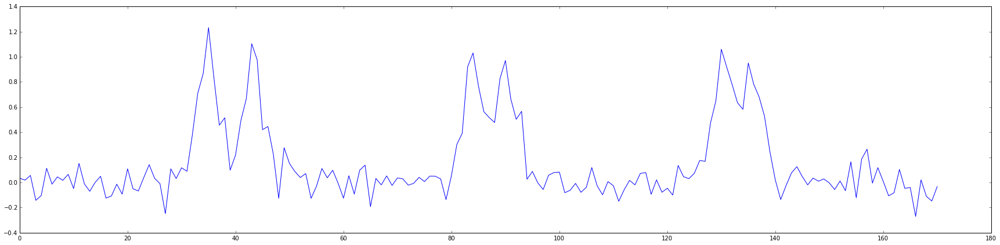

In [7]:
data_noised = data + np.random.normal(0, 0.1, len(data))
plt.figure(figsize=(30,7))
plt.plot(data_noised)

# Filter data with different window lengths

In [8]:
wl = np.array([5, 7, 11, 15, 19, 23, 27, 31])

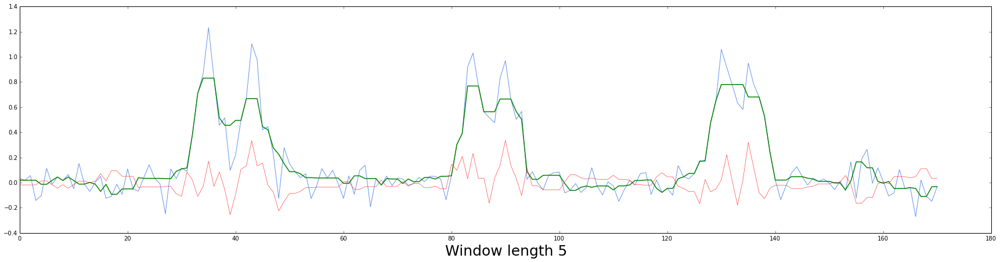

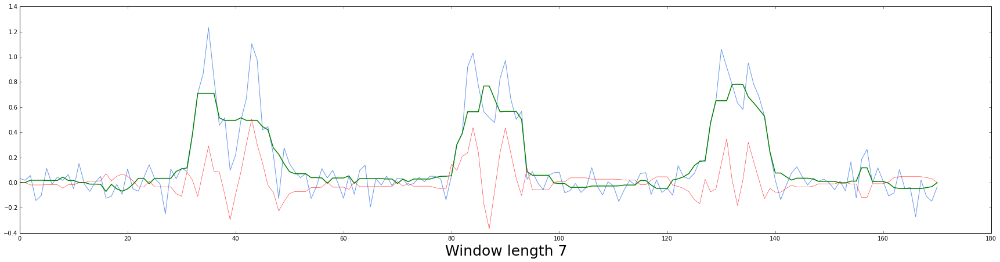

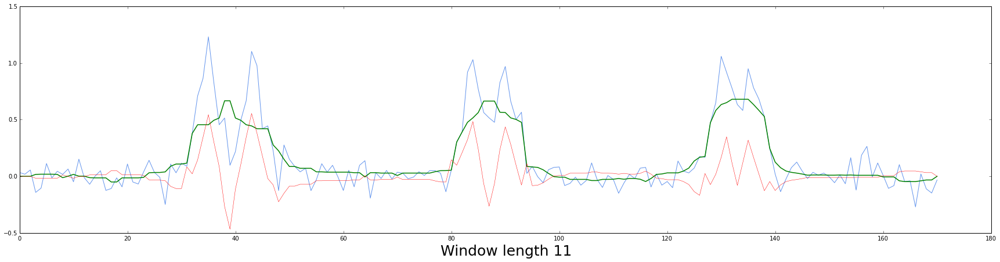

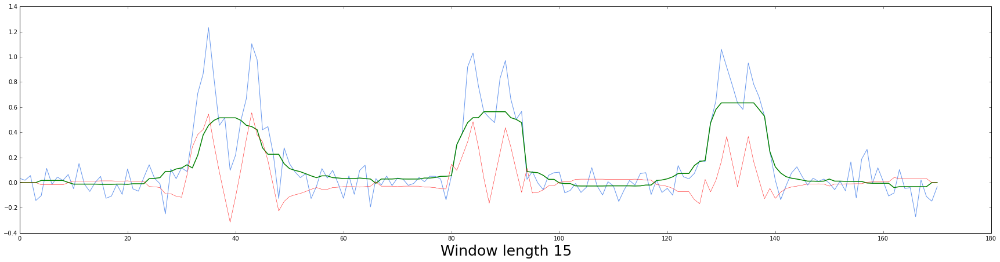

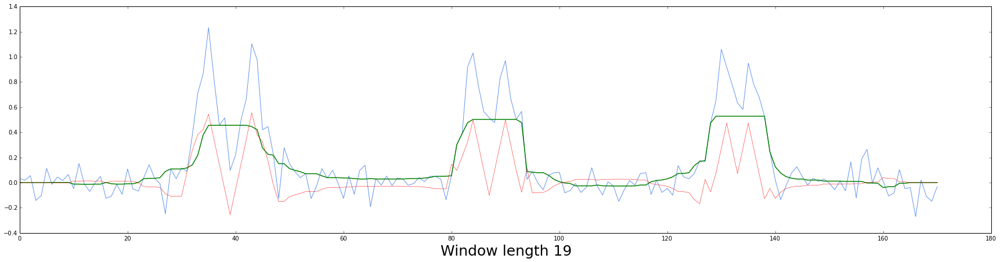

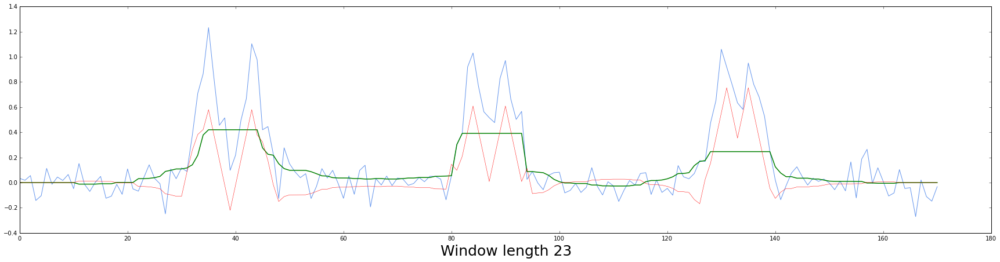

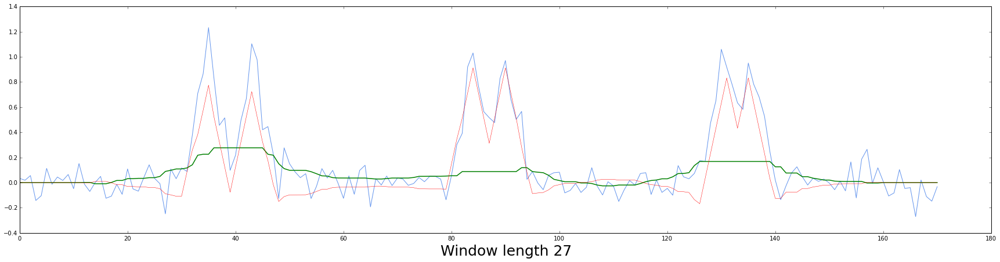

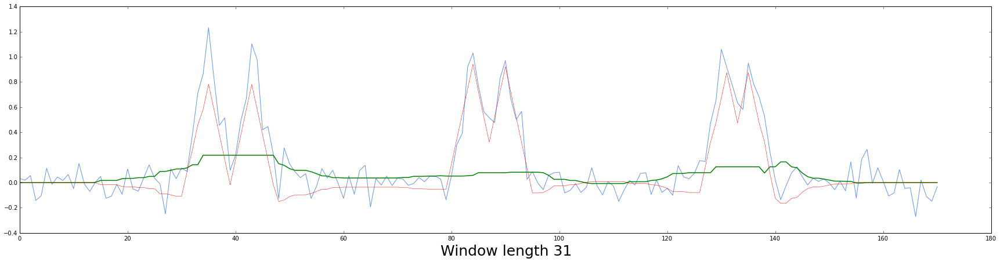

In [9]:
count = 0
for w in wl:
    count += 1
    fig = plt.figure(count, figsize=(30,7))
    plt.plot(data_noised, color = 'cornflowerblue')
    filtered = medfilt(data_noised, w)
    plt.plot(filtered, color = 'g', linewidth = 1.5)
    plt.plot(data - filtered, color = 'r', linewidth = 0.5)
    plt.xlabel('Window length ' + str(w), fontsize=25)

## Figures, double spikes with same distance between peaks

In [10]:
data1 = np.append(tri1,x)
for i in range(5):
    data1 = np.append(data1,tri1)
    data1 = np.append(data1,x)

In [11]:
data2 = np.append(tri2,x)
for i in range(5):
    data2 = np.append(data2,tri2)
    data2 = np.append(data2,x)

In [12]:
data3 = np.append(tri3,x)
for i in range(5):
    data3 = np.append(data3,tri3)
    data3 = np.append(data3,x)

In [14]:
data4 = np.append(tri4,x)
for i in range(5):
    data4 = np.append(data4,tri4)
    data4 = np.append(data4,x)

In [16]:
from PIL import Image

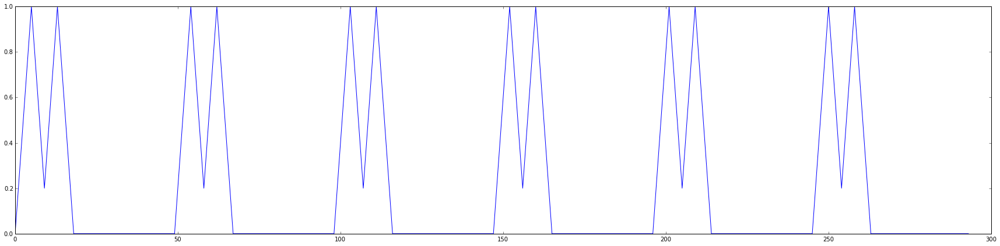

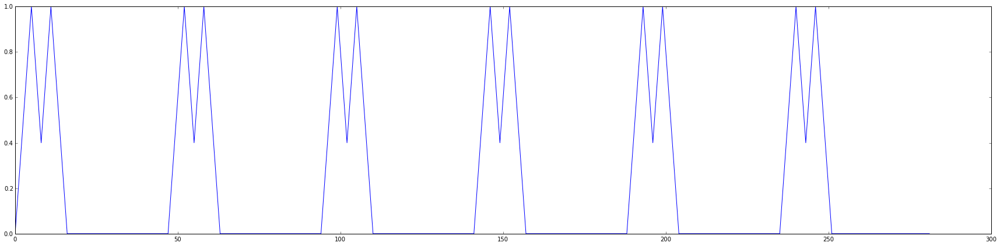

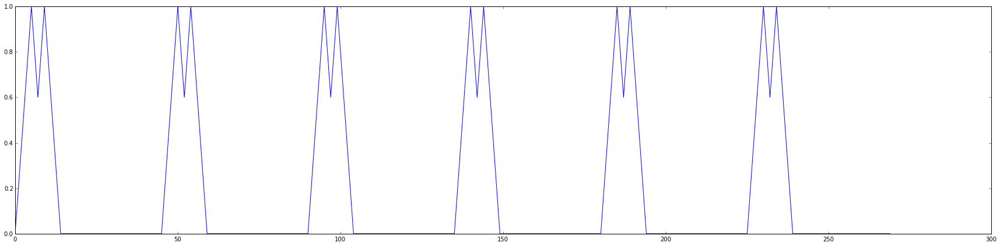

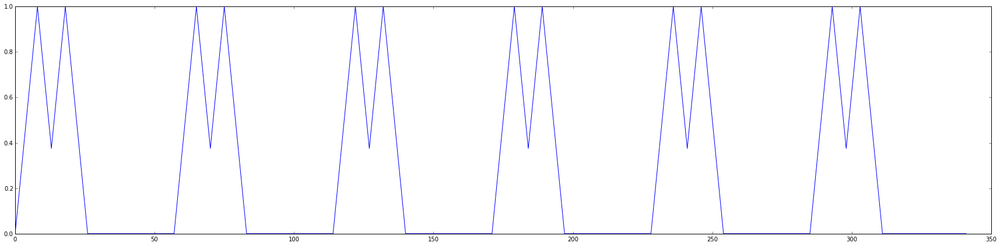

In [21]:
plt.figure(1, figsize=(30,7))
plt.plot(data1)
plt.figure(2, figsize=(30,7))
plt.plot(data2)
plt.figure(3, figsize=(30,7))
plt.plot(data3)
plt.figure(4, figsize=(30,7))
plt.plot(data4)

In [35]:
# Array with the different window lengths we use for the filter.
wl = np.array([3, 5, 11, 15, 17, 21, 25, 31, 35, 39, 45, 47, 51, 55, 57, 61, 75])

In [36]:
filtered1 = np.zeros((140, len(data1)))
filtered_spikes = np.zeros((140, len(data1)))
rms = np.zeros(140)
values1 = np.zeros(len(wl))
count = -1
for w in wl:
    count += 1
    for i in range(len(filtered1)):
        data1_noised = data1 + np.random.normal(0, 0.15, len(data1))
        filtered1[i,:] = medfilt(data1_noised, w)
        filtered_spikes[i,:] = data1 - filtered1[i,:]
        #rms[i] = np.sqrt(np.mean(np.square(filtered1[i,:])))
        rms[i] = np.sqrt(np.mean(np.square(filtered_spikes[i,:])))
    mean = np.mean(rms)
    values1[count] = mean 

In [37]:
filtered2 = np.zeros((140, len(data2)))
filtered_spikes = np.zeros((140, len(data2)))
rms = np.zeros(140)
values2 = np.zeros(len(wl))
count = -1
for w in wl:
    count += 1
    for i in range(len(filtered2)):
        data2_noised = data2 + np.random.normal(0, 0.15, len(data2))
        filtered2[i,:] = medfilt(data2_noised, w)
        filtered_spikes[i,:] = data2 - filtered2[i,:]
        #rms[i] = np.sqrt(np.mean(np.square(filtered2[i,:])))
        rms[i] = np.sqrt(np.mean(np.square(filtered_spikes[i,:])))
    mean = np.mean(rms)
    values2[count] = mean 

In [38]:
filtered3 = np.zeros((140, len(data3)))
filtered_spikes = np.zeros((140, len(data3)))
rms = np.zeros(140)
values3 = np.zeros(len(wl))
count = -1
for w in wl:
    count += 1
    for i in range(len(filtered3)):
        data3_noised = data3 + np.random.normal(0, 0.15, len(data3))
        filtered3[i,:] = medfilt(data3_noised, w)
        filtered_spikes[i,:] = data3 - filtered3[i,:]
        #rms[i] = np.sqrt(np.mean(np.square(filtered3[i,:])))
        rms[i] = np.sqrt(np.mean(np.square(filtered_spikes[i,:])))
    mean = np.mean(rms)
    values3[count] = mean 

In [39]:
filtered4 = np.zeros((140, len(data4)))
filtered_spikes = np.zeros((140, len(data4)))
rms = np.zeros(140)
values4 = np.zeros(len(wl))
count = -1
for w in wl:
    count += 1
    for i in range(len(filtered4)):
        data4_noised = data4 + np.random.normal(0, 0.15, len(data4))
        filtered4[i,:] = medfilt(data4_noised, w)
        filtered_spikes[i,:] = data4 - filtered4[i,:]
        #rms[i] = np.sqrt(np.mean(np.square(filtered3[i,:])))
        rms[i] = np.sqrt(np.mean(np.square(filtered_spikes[i,:])))
    mean = np.mean(rms)
    values4[count] = mean 

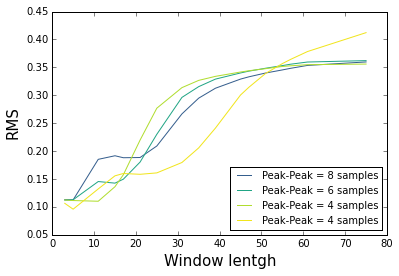

In [40]:
viridis_data = np.loadtxt('viridis_data.txt')
plt.figure()
plt.plot(wl, values1, color = viridis_data[75,:], label = 'Peak-Peak = 8 samples')
plt.plot(wl, values2, color = viridis_data[150,:], label = 'Peak-Peak = 6 samples')
plt.plot(wl, values3, color = viridis_data[225,:], label = 'Peak-Peak = 4 samples')
plt.plot(wl, values4, color = viridis_data[250,:], label = 'Peak-Peak = 4 samples')
plt.ylabel('RMS', fontsize = 15)
plt.xlabel('Window lentgh', fontsize = 15)
plt.legend(loc='lower right',prop={'size':10})
plt.savefig('Oerlapping spikes.png', dpi = 300)

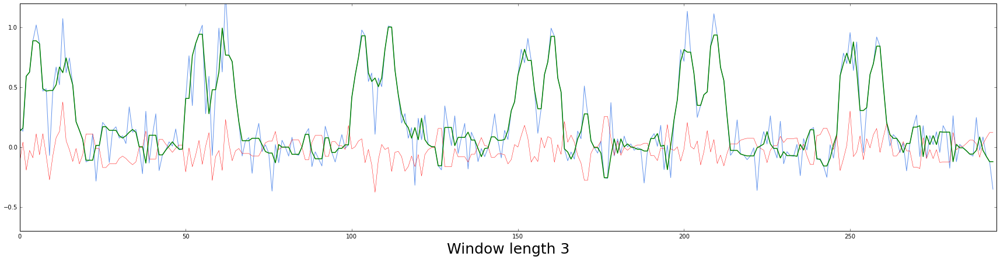

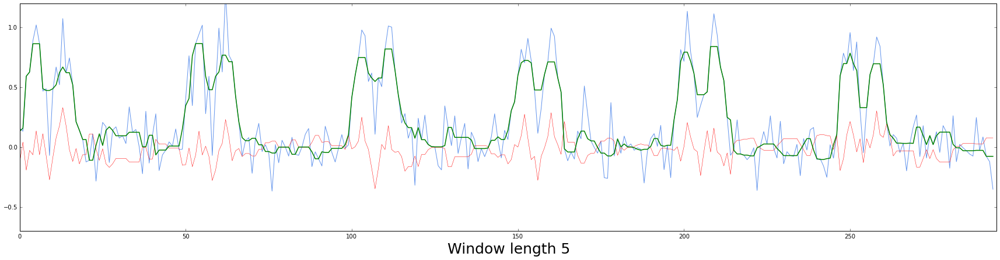

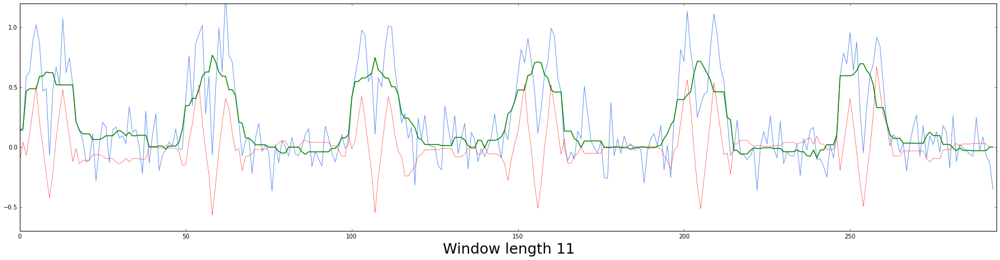

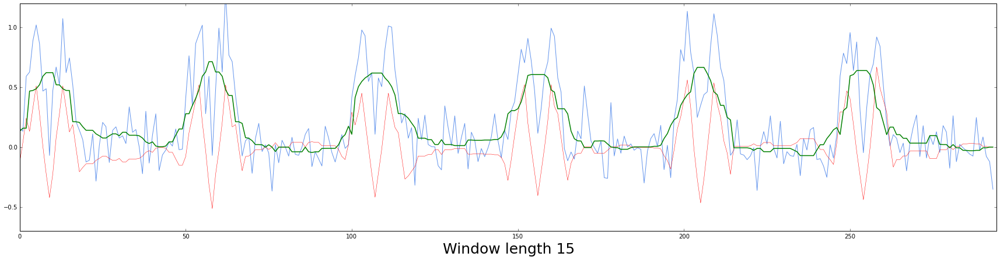

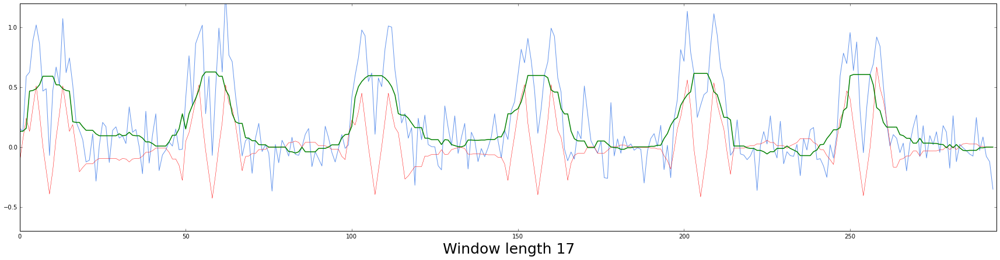

...

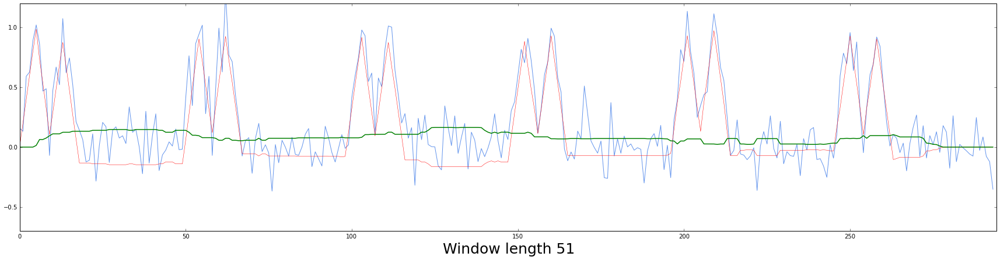

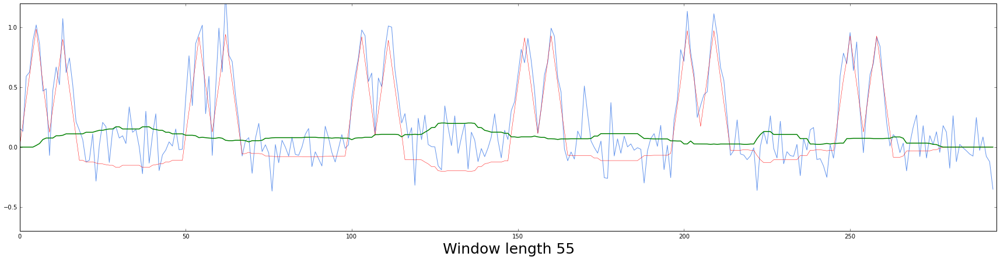

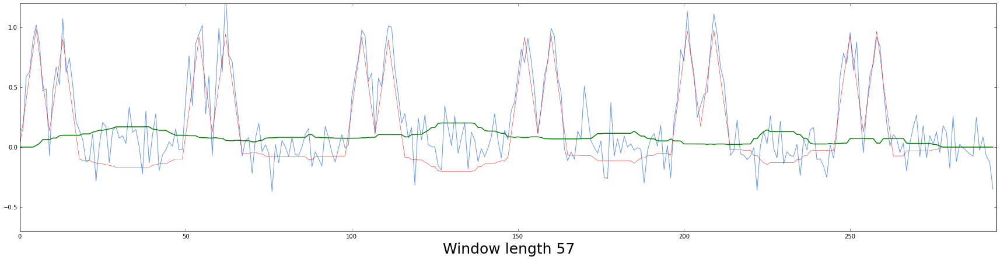

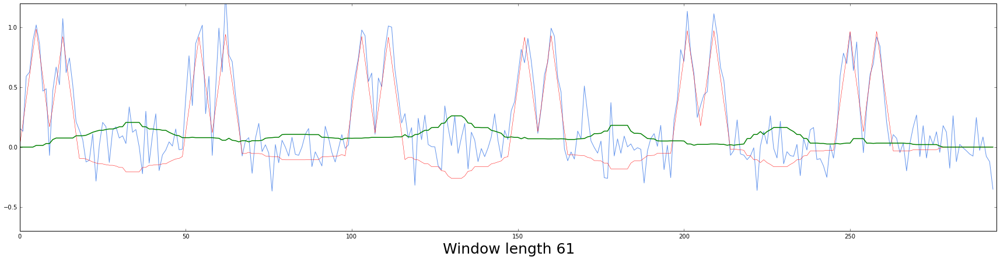

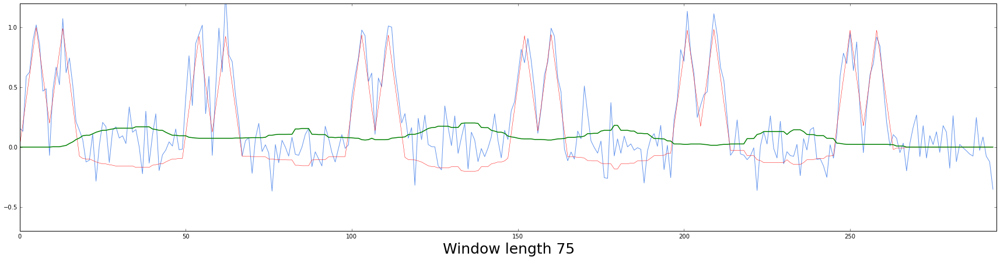

In [41]:
count = -1
for w in wl:
    count += 1
    fig = plt.figure(count, figsize=(30,7))
    plt.axis((0, len(data1) , -0.7, 1.2))
    plt.plot(data1_noised, color = 'cornflowerblue')
    filtered1[count,:] = medfilt(data1_noised, w)
    plt.plot(data1-filtered1[count,:], color = 'r', lw = 0.5)
    plt.plot(filtered1[count,:], color = 'g', lw = 1.5)
    plt.xlabel('Window length ' + str(w), fontsize=25)

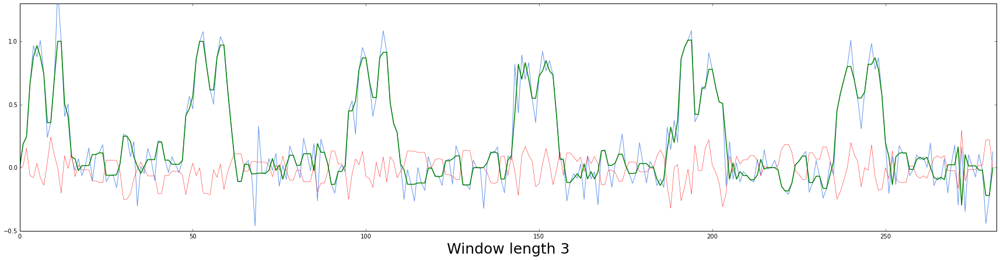

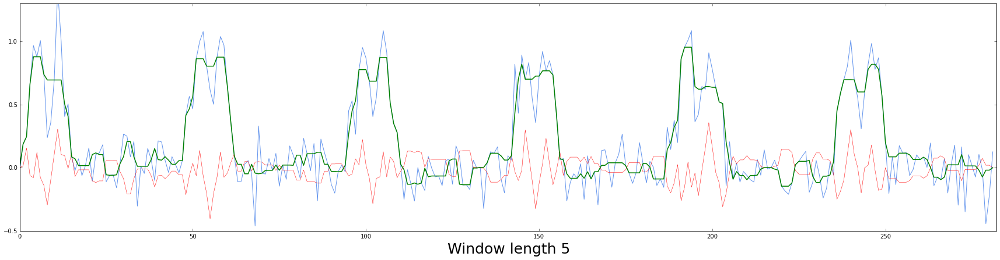

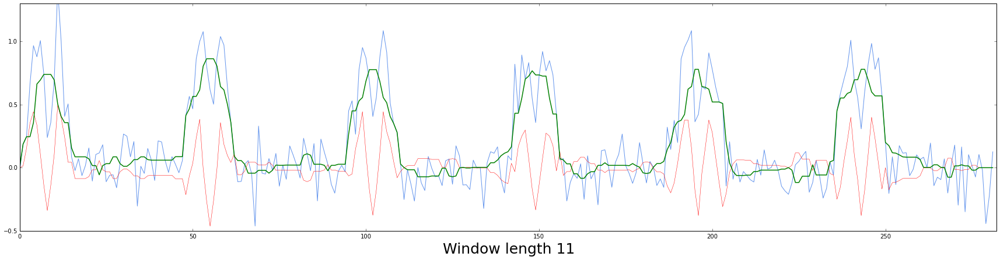

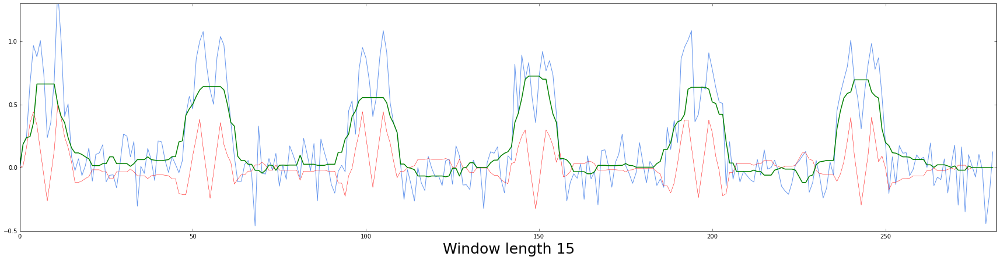

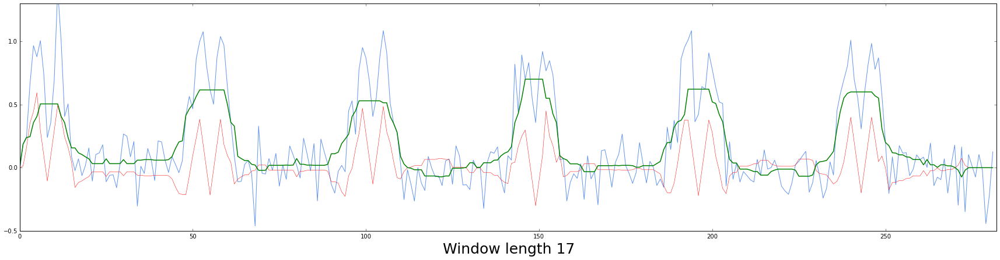

...

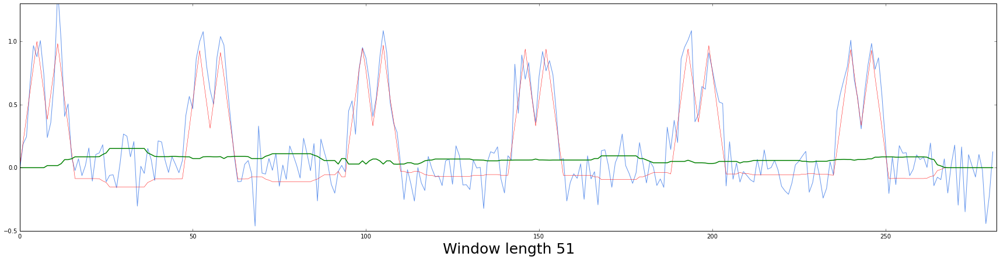

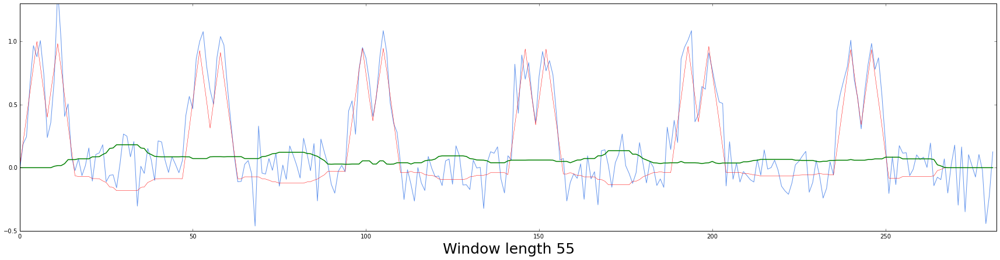

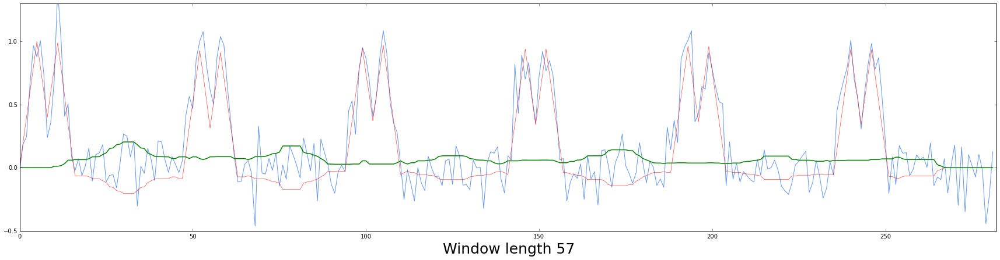

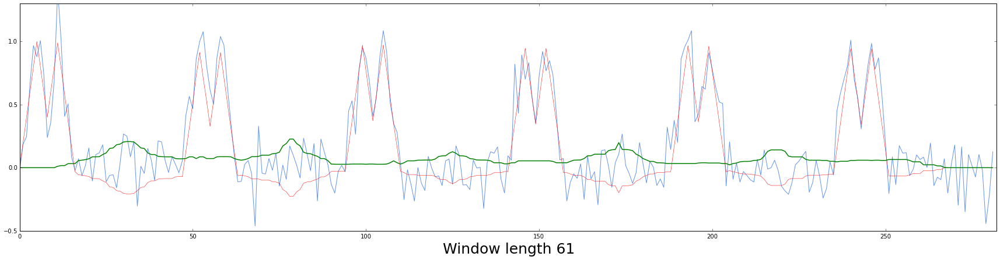

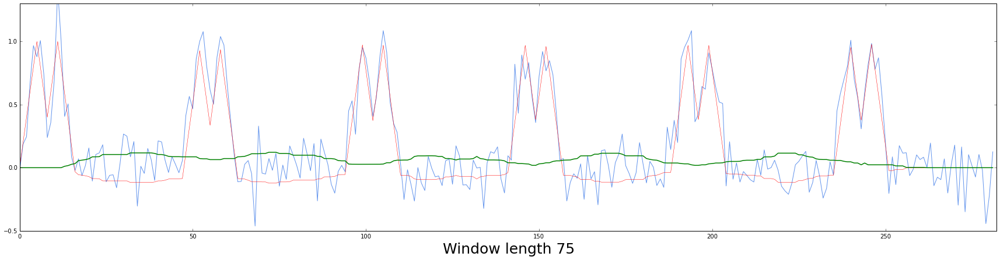

In [53]:
count = -1
for w in wl:
    count += 1
    fig = plt.figure(count, figsize=(30,7))
    plt.axis((0, len(data2), -0.5, 1.3))
    plt.plot(data2_noised, color = 'cornflowerblue')
    filtered2[count,:] = medfilt(data2_noised, w)
    plt.plot(data2-filtered2[count,:], color = 'r', lw = 0.5)
    plt.plot(filtered2[count,:], color = 'g', lw = 1.5)
    plt.xlabel('Window length ' + str(w), fontsize=25)

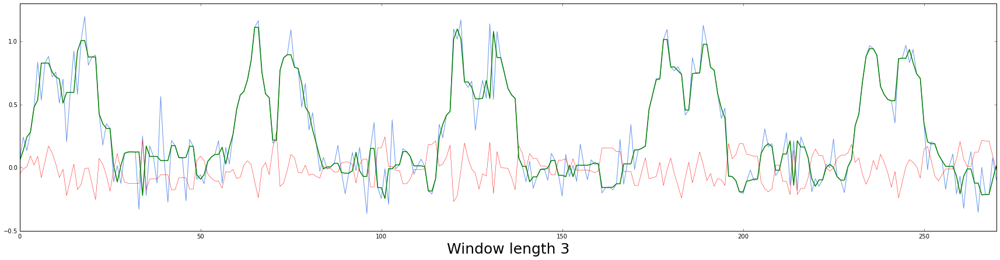

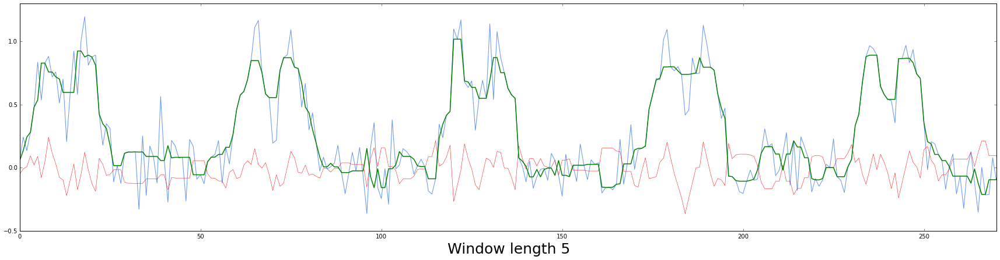

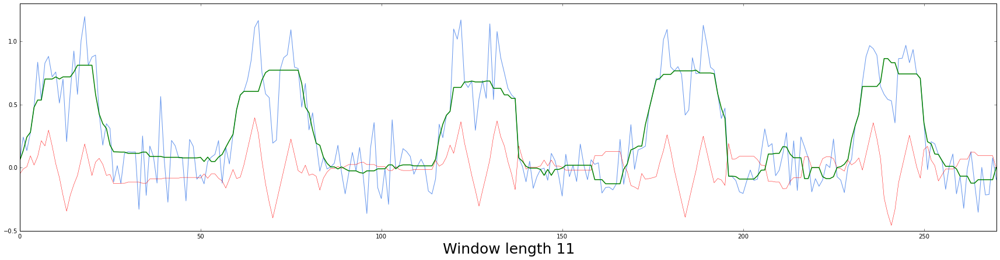

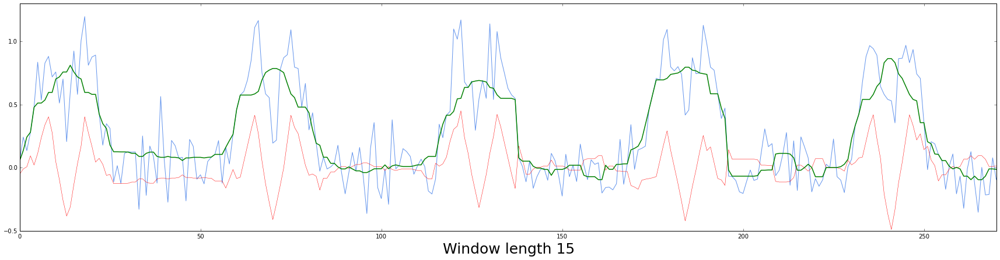

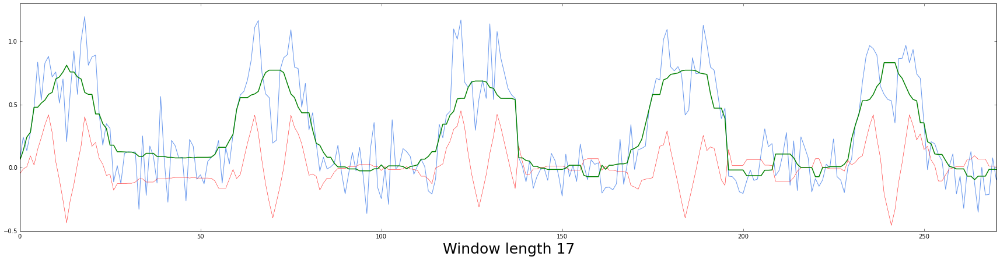

...

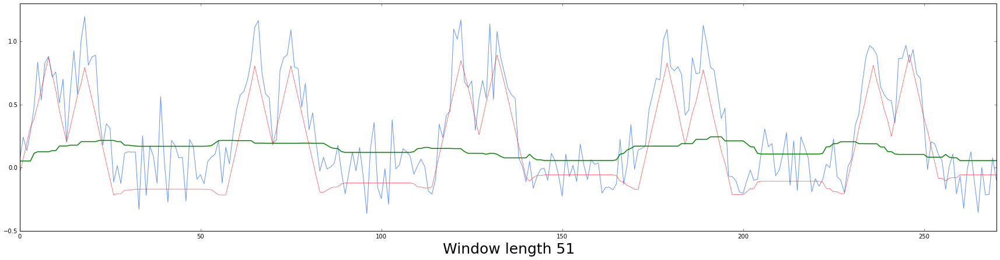

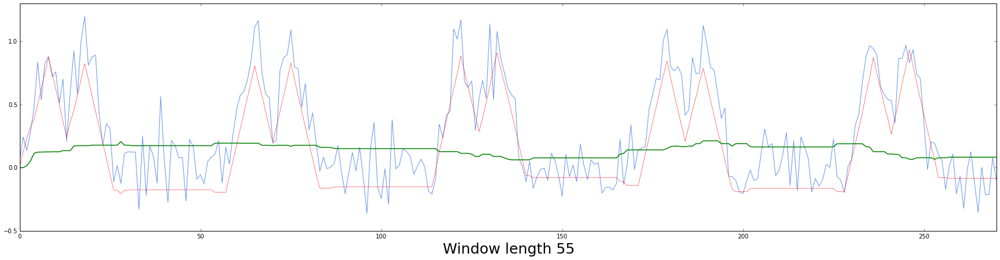

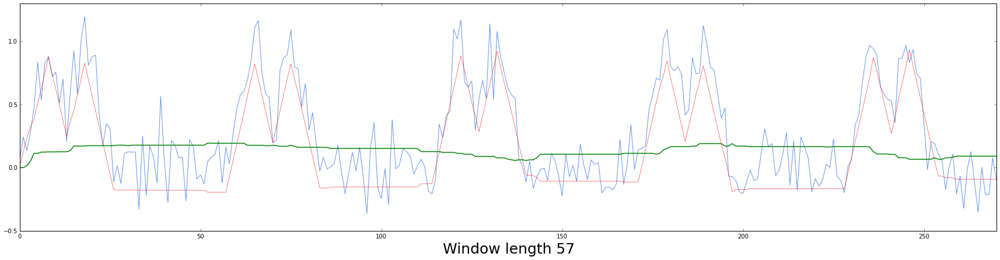

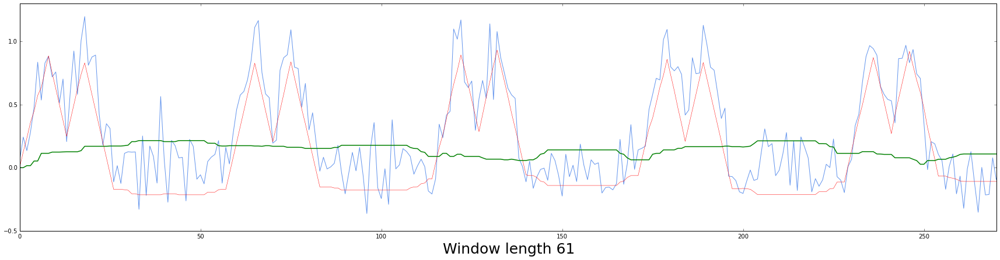

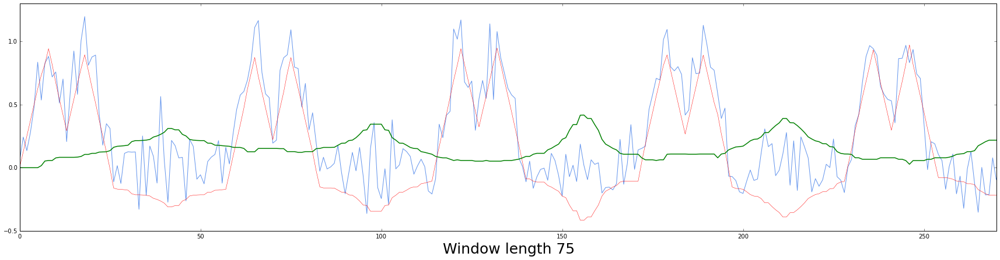

In [43]:
count = -1
for w in wl:
    count += 1
    fig = plt.figure(count, figsize=(30,7))
    plt.axis((0, len(data3), -0.5, 1.3))
    plt.plot(data4_noised, color = 'cornflowerblue')
    filtered4[count,:] = medfilt(data4_noised, w)
    plt.plot(data4-filtered4[count,:], color = 'r', lw = 0.5)
    plt.plot(filtered4[count,:], color = 'g', lw = 1.5)
    plt.xlabel('Window length ' + str(w), fontsize=25)

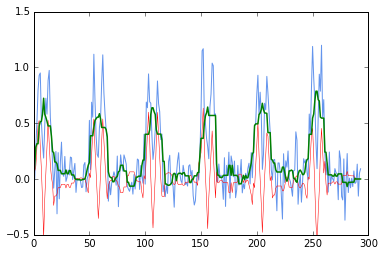

In [75]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data1_noised, color = 'cornflowerblue')
plt.plot(data1 - filtered1[2,:], color = 'r', linewidth = 0.5)
plt.plot(filtered1[2,:], color = 'g', linewidth = 1.5)
plt.savefig('values1, wl 11.png', dpi = 300)

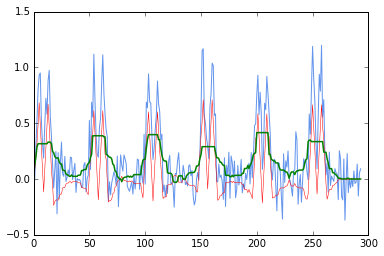

In [72]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data1_noised, color = 'cornflowerblue')
plt.plot(data1 - filtered1[6,:], color = 'r', linewidth = 0.5)
plt.plot(filtered1[6,:], color = 'g', linewidth = 1.5)
plt.savefig('values1, wl 25.png', dpi = 300)

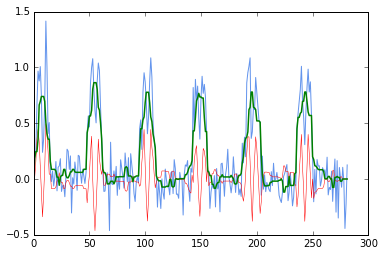

In [68]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data2_noised, color = 'cornflowerblue')
plt.plot(data2 - filtered2[2,:], color = 'r', linewidth = 0.5)
plt.plot(filtered2[2,:], color = 'g', linewidth = 1.5)
plt.savefig('Values2, wl 11.png', dpi = 300)

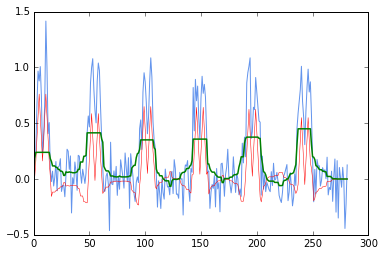

In [73]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data2_noised, color = 'cornflowerblue')
plt.plot(data2 - filtered2[6,:], color = 'r', linewidth = 0.5)
plt.plot(filtered2[6,:], color = 'g', linewidth = 1.5)
plt.savefig('Values2, wl 25.png', dpi = 300)

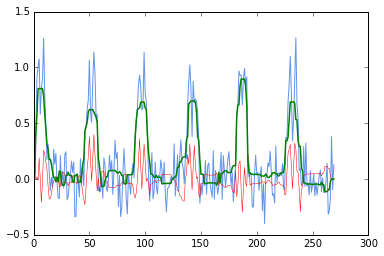

In [70]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data3_noised, color = 'cornflowerblue')
plt.plot(data3 - filtered3[2,:], color = 'r', linewidth = 0.5)
plt.plot(filtered3[2,:], color = 'g', linewidth = 1.5)
plt.savefig('Values3, wl 11.png', dpi = 300)

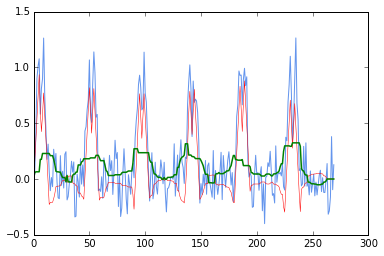

In [74]:
plt.figure()
plt.axis([0,300,-0.5,1.5])
plt.plot(data3_noised, color = 'cornflowerblue')
plt.plot(data3 - filtered3[6,:], color = 'r', linewidth = 0.5)
plt.plot(filtered3[6,:], color = 'g', linewidth = 1.5)
plt.savefig('Values3, wl 25.png', dpi = 300)